In [1]:
import pandas as pd
import numpy as np
import igraph as ig
import collections
import matplotlib
%matplotlib inline

## Explore Data

In [2]:
df_unweighted = pd.read_csv('combined_final_unweighted.csv')
df_unweighted

,node_start,node_end,status
0,Hong Kong,Samoa,jurisdiction
1,Hong Kong,Samoa,jurisdiction
2,Hong Kong,Samoa,jurisdiction
3,Hong Kong,Samoa,jurisdiction
4,Hong Kong,Samoa,jurisdiction
...,...,...,...
338127,Indonesia,British Virgin Islands,officer_base
338128,Cook Islands,British Virgin Islands,officer_base
338129,Hong Kong,British Virgin Islands,officer_base
338130,Cook Islands,United Kingdom,officer_base


In [3]:
df_weighted = pd.read_csv('combined_final_weighted.csv')
df_weighted

,node_start,node_end,status,weight
0,Hong Kong,Samoa,jurisdiction,2.0
1,Hong Kong,Samoa,jurisdiction,2.0
2,Hong Kong,Samoa,jurisdiction,2.0
3,Hong Kong,Samoa,jurisdiction,2.0
4,Hong Kong,Samoa,jurisdiction,2.0
...,...,...,...,...
338119,Indonesia,British Virgin Islands,officer_base,1.0
338120,Cook Islands,British Virgin Islands,officer_base,1.0
338121,Hong Kong,British Virgin Islands,officer_base,1.0
338122,Cook Islands,United Kingdom,officer_base,1.0


In [4]:
df_weighted['status'].unique()

array(['jurisdiction', 'intermediary_base', 'intermediary_jurisdiction',
       'officer_base', 'officer_jurisdiction'], dtype=object)

In [5]:
df_weighted_grouped = pd.read_csv('combined_final_weighted_groupedby.csv')
df_weighted_grouped

,node_start,node_end,weight
0,Albania,Bahamas,4.0
1,Algeria,British Virgin Islands,2.0
2,Algeria,United Kingdom,2.0
3,Algeria,United States,1.0
4,Andorra,Bahamas,52.0
...,...,...,...
2835,Zimbabwe,Hong Kong,3.0
2836,Zimbabwe,Jersey,1.0
2837,Zimbabwe,Panama,6.0
2838,Zimbabwe,Russia,2.0


In [6]:
df_weighted_grouped.describe()

,weight
count,2840.000000
mean,194.889613
std,1729.454201
min,0.500000
25%,2.000000
50%,5.000000
75%,24.000000
max,65366.500000


### Convert Data to an Undirected Edge List

In [7]:
df_weighted_grouped_list = df_weighted_grouped.values.tolist()
df_weighted_grouped_list

[['Albania', 'Bahamas', 4.0],
 ['Algeria', 'British Virgin Islands', 2.0],
 ['Algeria', 'United Kingdom', 2.0],
 ['Algeria', 'United States', 1.0],
 ['Andorra', 'Bahamas', 52.0],
 ['Andorra', 'British Virgin Islands', 82.0],
 ['Andorra', 'Cayman Islands', 2.0],
 ['Andorra', 'Cook Islands', 0.5],
 ['Andorra', 'Costa Rica', 6.0],
 ['Andorra', 'Hong Kong', 18.0],
 ['Andorra', 'Ireland', 1.0],
 ['Andorra', 'Latvia', 1.0],
 ['Andorra', 'Nevada', 48.0],
 ['Andorra', 'Niue', 24.0],
 ['Andorra', 'Panama', 558.0],
 ['Andorra', 'Russia', 2.0],
 ['Andorra', 'Samoa', 18.0],
 ['Andorra', 'Seychelles', 144.0],
 ['Andorra', 'United Kingdom', 2.0],
 ['Andorra', 'Uruguay', 30.0],
 ['Angola', 'Bermuda', 2.0],
 ['Angola', 'British Virgin Islands', 23.0],
 ['Angola', 'China', 1.0],
 ['Antigua and Barbuda', 'Barbados', 16.0],
 ['Antigua and Barbuda', 'British Virgin Islands', 16.5],
 ['Antigua and Barbuda', 'Canada', 1.0],
 ['Antigua and Barbuda', 'Cayman Islands', 2.0],
 ['Antigua and Barbuda', 'China', 4

In [8]:
d = collections.defaultdict(int)
for n1, n2, v in df_weighted_grouped_list:
    d[min(n1, n2), max(n1, n2)] += v
result = [[k[0], k[1], v] for k, v in d.items()]

In [9]:
df_net = pd.DataFrame(result)
df_net

,0,1,2
0,Albania,Bahamas,4.0
1,Algeria,British Virgin Islands,2.0
2,Algeria,United Kingdom,2.0
3,Algeria,United States,1.0
4,Andorra,Bahamas,52.0
...,...,...,...
2383,Hong Kong,Zimbabwe,3.0
2384,Jersey,Zimbabwe,1.0
2385,Panama,Zimbabwe,6.0
2386,Russia,Zimbabwe,2.0


In [10]:
df_net = df_net.rename(columns = {0:'node_1', 1:'node_2', 2: 'weight'})
df_net

,node_1,node_2,weight
0,Albania,Bahamas,4.0
1,Algeria,British Virgin Islands,2.0
2,Algeria,United Kingdom,2.0
3,Algeria,United States,1.0
4,Andorra,Bahamas,52.0
...,...,...,...
2383,Hong Kong,Zimbabwe,3.0
2384,Jersey,Zimbabwe,1.0
2385,Panama,Zimbabwe,6.0
2386,Russia,Zimbabwe,2.0


In [11]:
#df_net.to_csv('undirected_weighted_grouped.csv', index = False)

In [12]:
df_net.describe()

,weight
count,2388.000000
mean,231.778266
std,1907.448852
min,0.500000
25%,2.000000
50%,5.000000
75%,30.000000
max,66262.500000


## Create Graph

In [13]:
g = ig.Graph.TupleList(df_net.itertuples(index=False), directed=False, edge_attrs={'weight': "weight"})


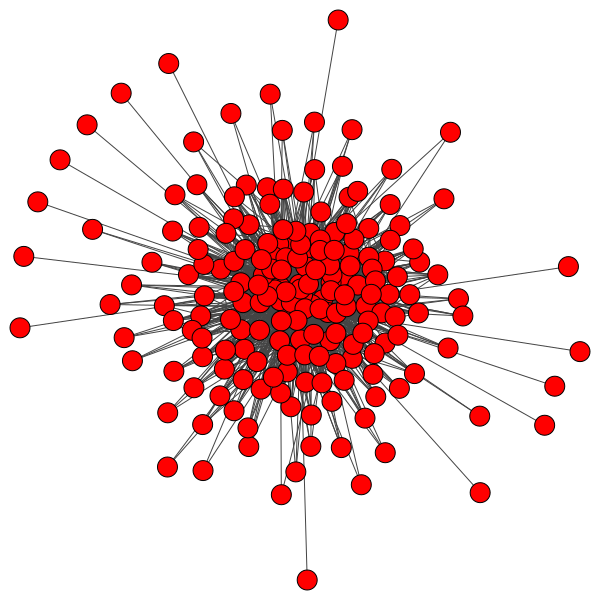

In [14]:
ig.plot(g)

In [15]:
g.diameter()

3

In [16]:
print( "Clustering Coefficient: ", g.transitivity_undirected())

Clustering Coefficient:  0.3859593515919117


In [17]:
np.mean(g.degree())

24.367346938775512

In [18]:
np.mean(g.strength(weights = 'weight'))

5647.821428571428

## Community Detection

### Louvain Community Detection

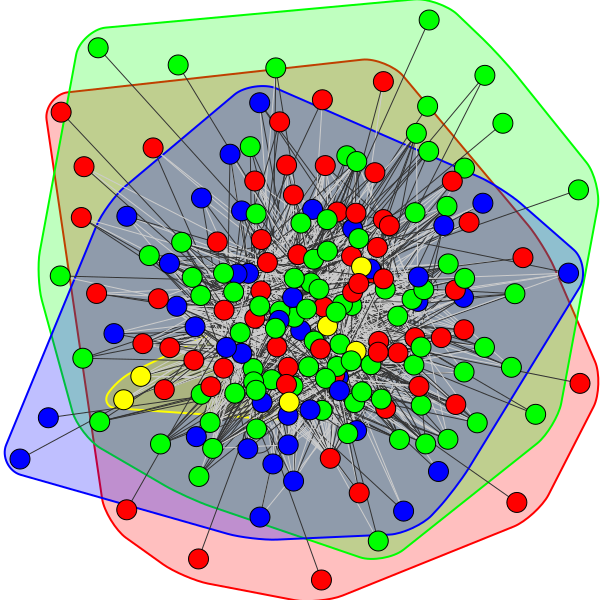

In [19]:
comm_louvain = g.community_multilevel(weights = 'weight')

ig.plot(comm_louvain, mark_groups = True, layout="drl")

In [20]:
modularity = g.modularity(comm_louvain, weights='weight')
print(modularity)

0.16204451440153889


In [21]:
df_louvain = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_louvain.membership } )
df_louvain

,name,community
0,Albania,0
1,Bahamas,0
2,Algeria,1
3,British Virgin Islands,1
4,United Kingdom,1
...,...,...
191,Venezuela,0
192,Vietnam,1
193,Yemen,0
194,Zambia,1


In [22]:
df_louvain.describe()

,community
count,196.000000
mean,0.948980
std,0.808575
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,3.000000


In [23]:
df_louvain[df_louvain['community'] == 0]

,name,community
0,Albania,0
1,Bahamas,0
6,Andorra,0
9,Costa Rica,0
13,Nevada,0
...,...,...
178,Sudan,0
180,Syria,0
189,Dubai,0
191,Venezuela,0


In [24]:
df_louvain[df_louvain['community'] == 1].head(99)

,name,community
2,Algeria,1
3,British Virgin Islands,1
4,United Kingdom,1
8,Cook Islands,1
10,Hong Kong,1
...,...,...
188,Uganda,1
190,Uzbekistan,1
192,Vietnam,1
194,Zambia,1


In [25]:
df_louvain[df_louvain['community'] == 2]

,name,community
5,United States,2
7,Cayman Islands,2
17,Samoa,2
21,Bermuda,2
23,Antigua and Barbuda,2
24,Barbados,2
25,Canada,2
26,Saint Kitts and Nevis,2
29,New Zealand,2
35,Austria,2


In [26]:
df_louvain[df_louvain['community'] == 3]

,name,community
32,Aruba,3
33,British Anguilla,3
73,Israel,3
110,Ghana,3
127,Italy,3
175,Slovenia,3


In [27]:
df_louvain[df_louvain['community'] == 4]

,name,community


In [28]:
# Define colors used for visualization
colors = ['blue', 'yellow', 'green','purple', 'pink', 'orange', 'lightcoral', 'plum', 'darkgreen', 'darkblue', 'rosybrown',
         'crimson', 'steelblue', 'khaki', 'moccasin', 'orangered', 'fuchsia', 'thistle', 'salmon', 'chocolate', 'lightseagreen',
         'springgreen', 'darkseagreen', 'deeppink', 'mediumvioletred','olive']

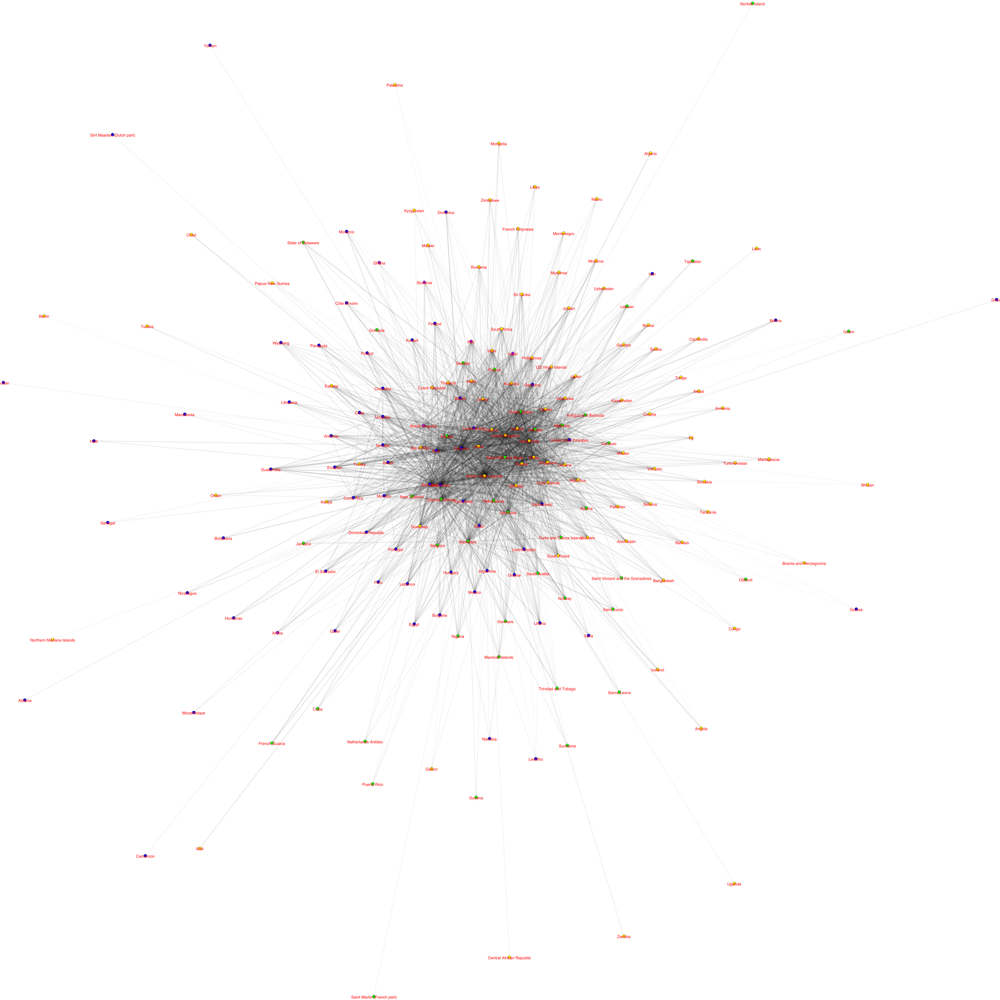

In [29]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_louvain.membership)):
    vertex_colors.append(colors[comm_louvain.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = np.log(g.es['weight']) + 1

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'images/louvain_communities.png', vertex_label = g.vs['name'] , **visual_style)

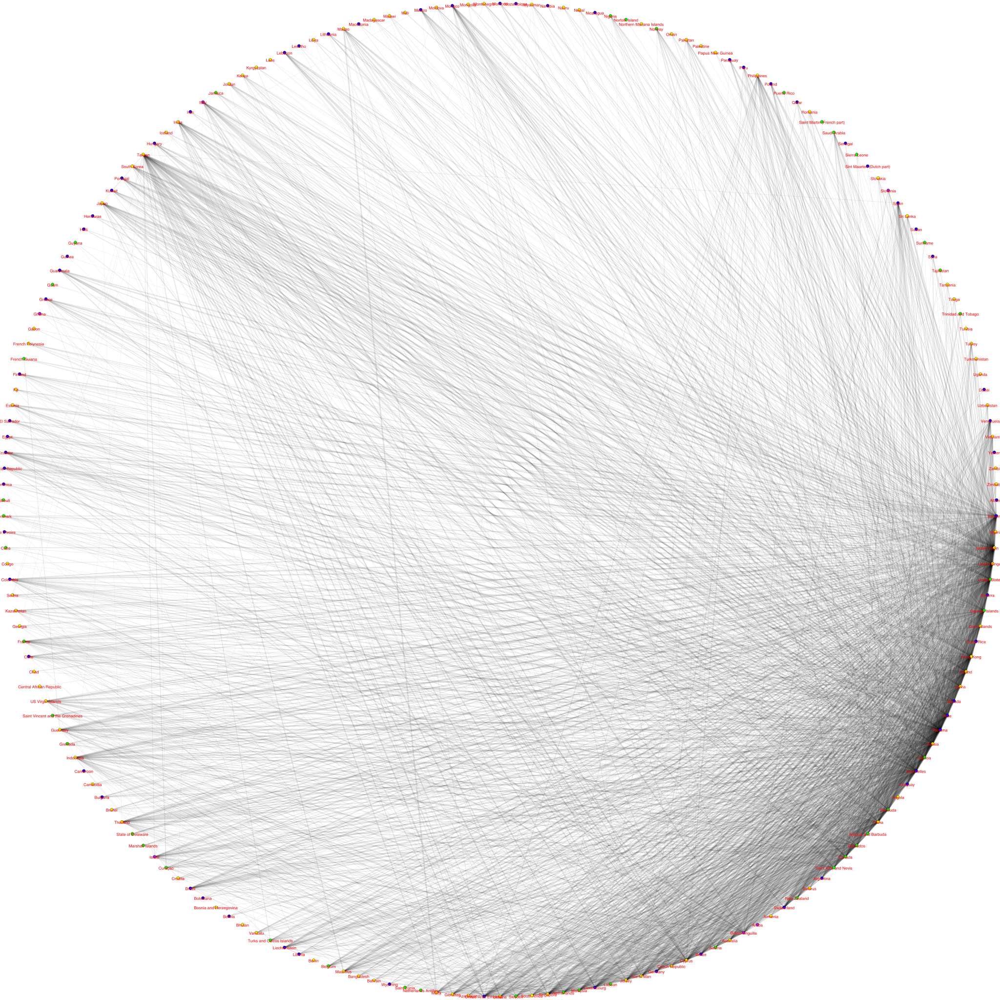

In [30]:
# Set the layout
my_layout = g.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'images/louvain_circular.png', vertex_label = g.vs['name'] , **visual_style)

In [31]:
for i in range(len(comm_louvain.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = np.log(comm_louvain.subgraphs()[i].es['weight']) + 1
    # Set the layout
    my_layout = comm_louvain.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_louvain.subgraphs()[i],'images/louvain_subgraph' + str(i) + '.png' ,vertex_label = comm_louvain.subgraphs()[i].vs['name'],**visual_style  )
    
    
    

In [32]:
# # Set vertex colours

# visual_style["bbox"] = (300,300)
# visual_style["margin"] = 17
# visual_style["vertex_color"] = 'orange'

# # Set vertex label size
# visual_style["vertex_label_size"] = 15

# # Set the layout
# my_layout = comm_louvain.cluster_graph().layout_fruchterman_reingold()
# visual_style["layout"] = my_layout

# ig.plot(comm_louvain.cluster_graph(),'images/test_cluster_graph.png' ,vertex_label = range(comm_louvain.cluster_graph().vcount()),**visual_style  )


### Label Propogation Community Detection

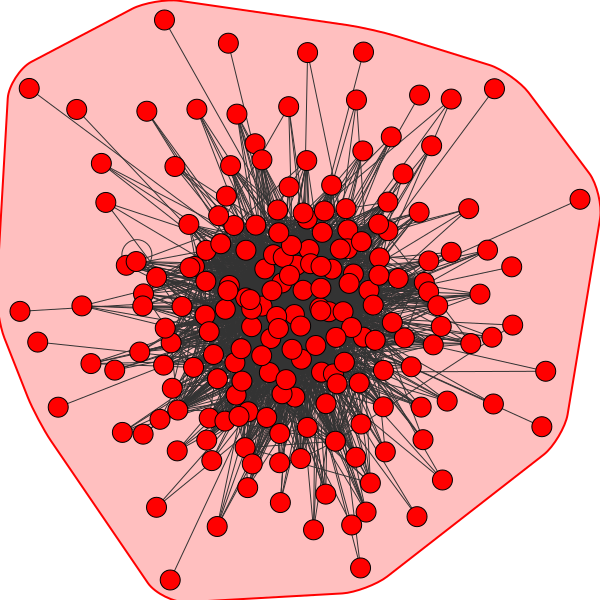

In [33]:
comm_lp= g.community_label_propagation(weights = 'weight')

ig.plot(comm_lp, mark_groups = True, layout="drl")

In [34]:
modularity = g.modularity(comm_lp, weights='weight')
print(modularity)

0.0


### Leading Eigenvector Community Detection

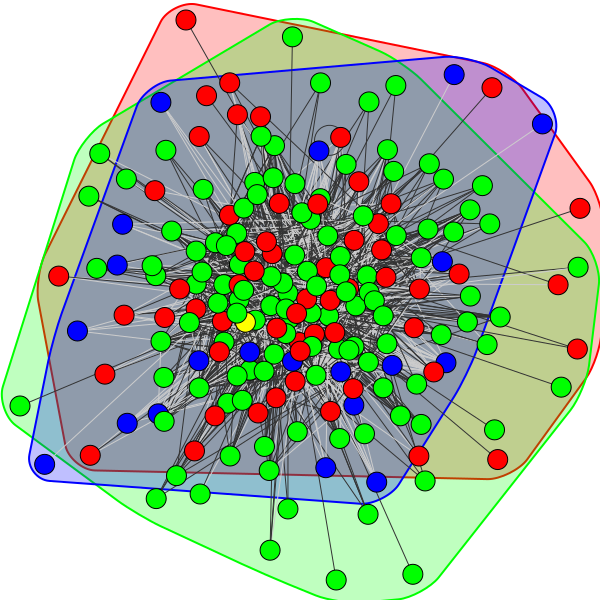

In [35]:
comm_leading_eigenvector= g.community_leading_eigenvector(weights = 'weight')

ig.plot(comm_leading_eigenvector, mark_groups = True, layout="drl")

In [36]:
modularity = g.modularity(comm_leading_eigenvector, weights='weight')
print(modularity)

0.15025680457793572


In [37]:
df_leading_eigenvector = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_leading_eigenvector.membership } )
df_leading_eigenvector

,name,community
0,Albania,0
1,Bahamas,0
2,Algeria,1
3,British Virgin Islands,1
4,United Kingdom,1
...,...,...
191,Venezuela,0
192,Vietnam,1
193,Yemen,0
194,Zambia,1


In [38]:
df_leading_eigenvector.describe()

,community
count,196.000000
mean,0.816327
std,0.621775
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,3.000000


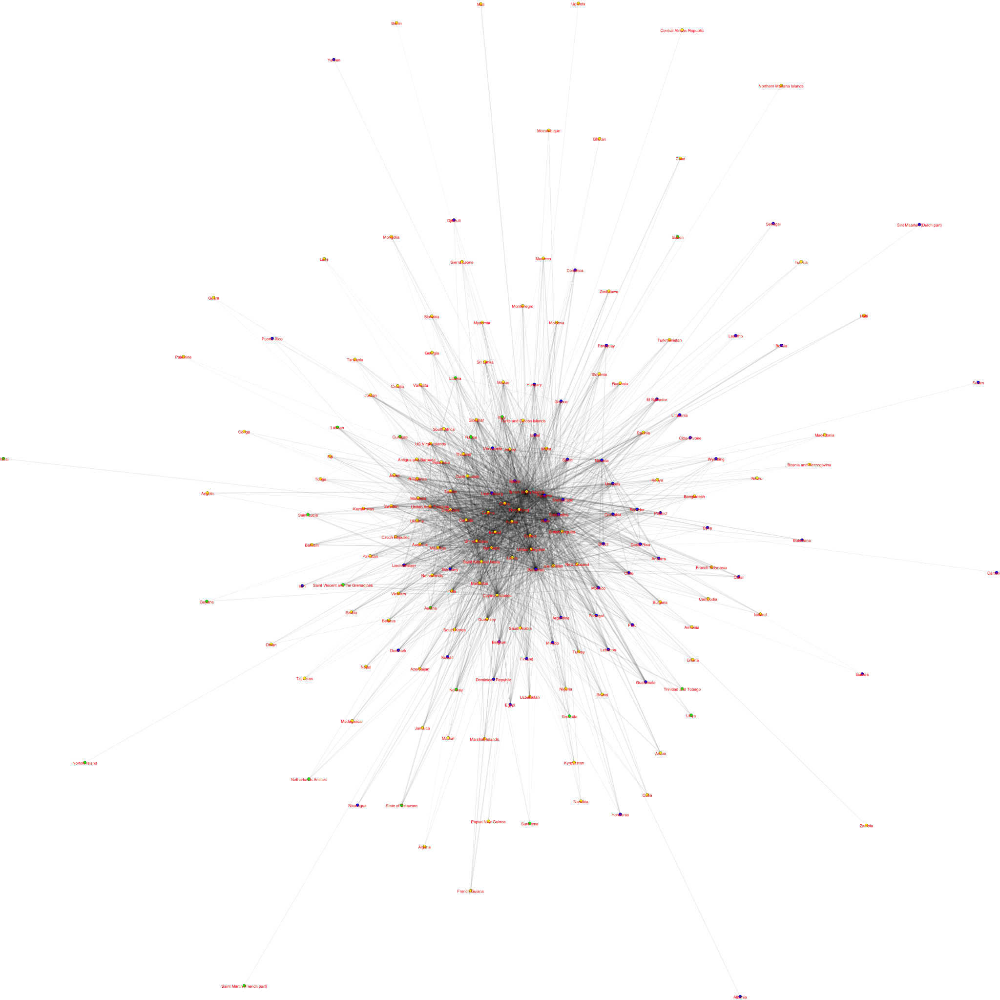

In [39]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_leading_eigenvector.membership)):
    vertex_colors.append(colors[comm_leading_eigenvector.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = np.log(g.es['weight']) + 1

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'images/communities_leading_eigenvector.png', vertex_label = g.vs['name'] , **visual_style)

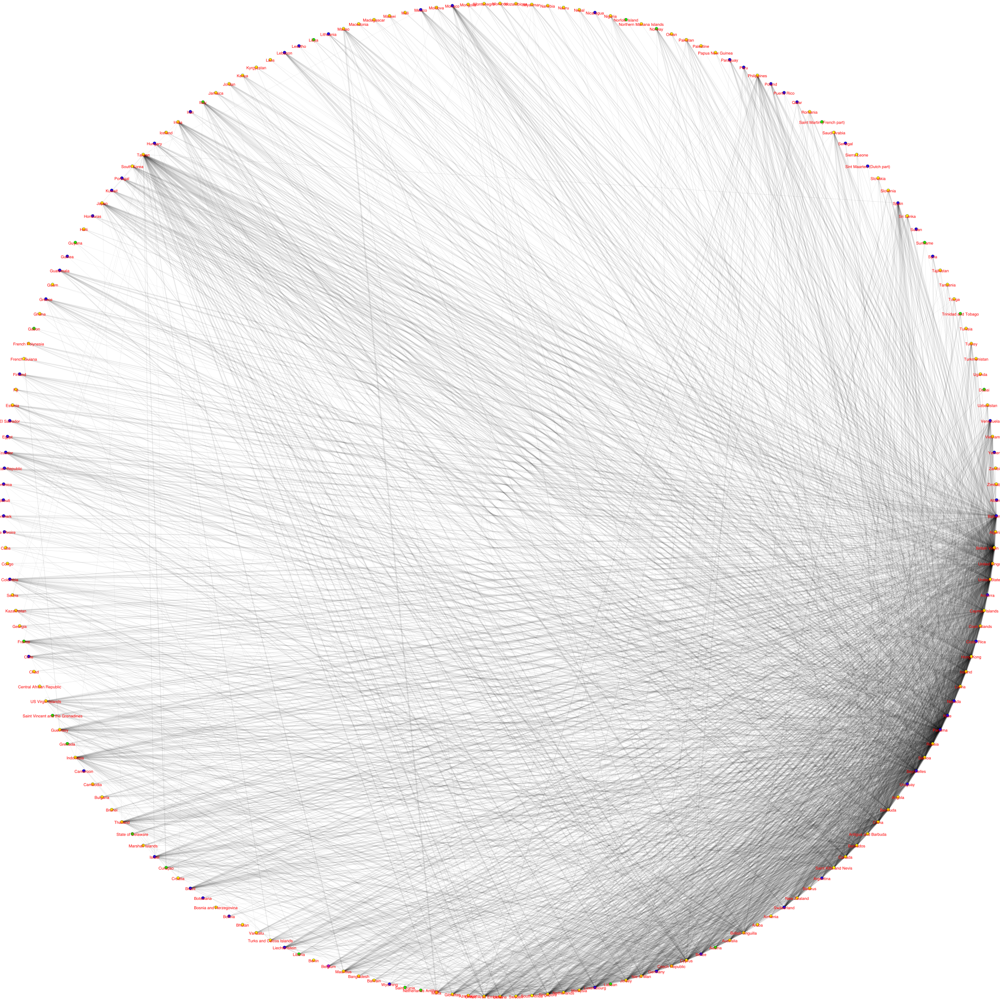

In [40]:
# Set the layout
my_layout = g.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'images/leading_vector_circular.png', vertex_label = g.vs['name'] , **visual_style)

In [41]:
for i in range(len(comm_leading_eigenvector.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = np.log(comm_leading_eigenvector.subgraphs()[i].es['weight']) + 1
    # Set the layout
    my_layout = comm_leading_eigenvector.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_leading_eigenvector.subgraphs()[i],'images/leading_eigenvector_subgraph' + str(i) + '.png' ,vertex_label = comm_leading_eigenvector.subgraphs()[i].vs['name'],**visual_style  )
    

### Leiden Community Detection

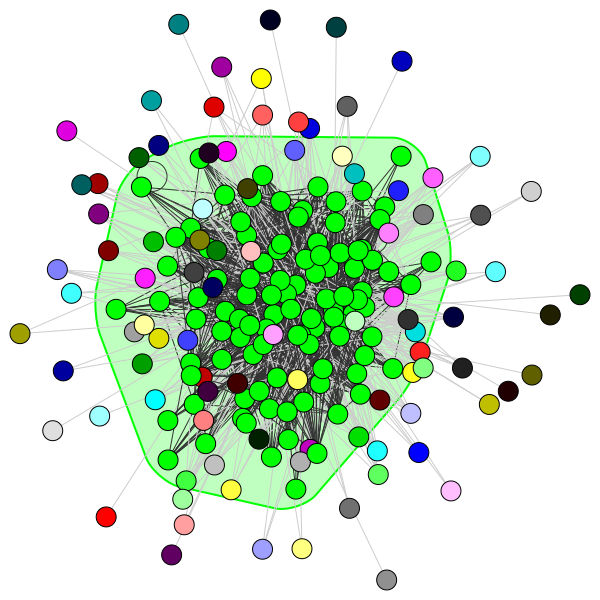

In [42]:
comm_leiden = g.community_leiden(weights = 'weight')

ig.plot(comm_leiden, mark_groups = True, layout="drl")

In [43]:
modularity = g.modularity(comm_leiden, weights='weight')
print(modularity)

-5.6863773329566016e-06


In [44]:
df_leiden = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_leiden.membership } )
df_leiden

,name,community
0,Albania,0
1,Bahamas,1
2,Algeria,2
3,British Virgin Islands,1
4,United Kingdom,1
...,...,...
191,Venezuela,1
192,Vietnam,1
193,Yemen,93
194,Zambia,94


In [45]:
df_leiden.describe()

,community
count,196.000000
mean,23.775510
std,30.350611
min,0.000000
25%,1.000000
50%,1.000000
75%,46.250000
max,95.000000


In [46]:
## no visualisation as most communities are individual?

### Optimal Modularity Community Detection

In [47]:
# #SLOW

# comm_opt_modularity = g.community_optimal_modularity(weights = 'weight')

# ig.plot(comm_opt_modularity, mark_groups = True, layout="drl")

In [48]:
# modularity = g.modularity(comm_opt_modularity, weights='weight')
# print(modularity)

In [49]:
# df_opt_modularity = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_opt_modularity.membership } )
# df_opt_modularity

In [50]:
# df_opt_modularity.describe

In [51]:
# ##plot community
# visual_style = {}

# vertex_colors = []

# for i in range(len(df_opt_modularity.membership)):
#     vertex_colors.append(colors[df_opt_modularity.membership[i]])
    
# # Set bbox and margin
# visual_style["bbox"] = (5000,5000)
# visual_style["margin"] = 17

# # Set vertex colours
# visual_style["vertex_color"] = vertex_colors

# # Set edge width
# visual_style["edge_width"] = np.log(g.es['weight']) + 1

# # Set edge color
# visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# # Set vertex size
# visual_style["vertex_size"] = 15

# # Set vertex label size
# visual_style["vertex_label_size"] = 20

# # Set vertex label color
# visual_style["vertex_label_color"] = 'red'

# # Don't curve the edges
# visual_style["edge_curved"] = False

# # Set the layout
# my_layout = g.layout_fruchterman_reingold()
# visual_style["layout"] = my_layout

# # Plot the graph
# ig.plot(g,'images/communities_optimal_modularity.png', vertex_label = g.vs['name'] , **visual_style)

In [52]:
# # Set the layout
# my_layout = g.layout_circle()
# visual_style["layout"] = my_layout

# # Plot the graph
# ig.plot(g,'images/optimal_modularity_circular.png', vertex_label = g.vs['name'] , **visual_style)

In [53]:
# for i in range(len(optimal_modularity.subgraphs())):
    
#     visual_style["bbox"] = (2000,2000)
#     visual_style["margin"] = 17
    
#     # Set vertex colours
#     visual_style["vertex_color"] = 'green'

#     # Set edge width
#     visual_style["edge_width"] = np.log(optimal_modularity.subgraphs()[i].es['weight']) + 1
#     # Set the layout
#     my_layout = optimal_modularity_circular.subgraphs()[i].layout_fruchterman_reingold()
#     visual_style["layout"] = my_layout

#     ig.plot(optimal_modularity_circular.subgraphs()[i],'images/optimal_modularity_subgraph' + str(i) + '.png' ,vertex_label = optimal_modularity.subgraphs()[i].vs['name'],**visual_style  )
    

### Spinglass Community Detection

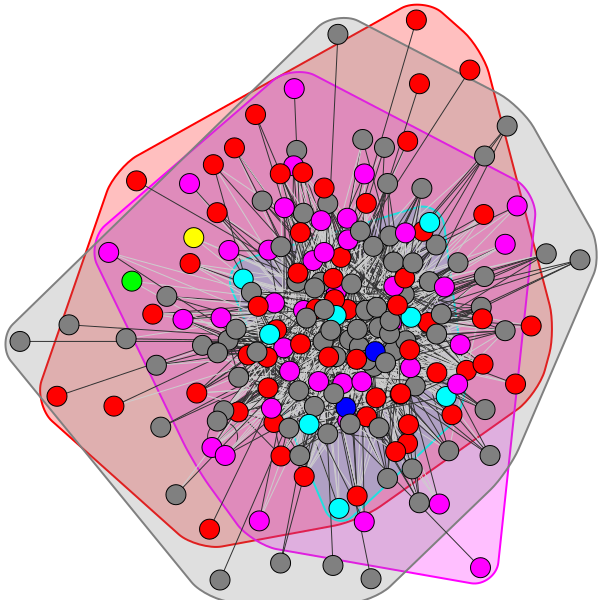

In [54]:
comm_spinglass = g.community_spinglass(weights = 'weight')

ig.plot(comm_spinglass, mark_groups = True, layout="drl")

In [55]:
modularity = g.modularity(comm_spinglass, weights='weight')
print(modularity)

0.16224275773108204


In [56]:
df_spinglass = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_spinglass.membership } )
df_spinglass

,name,community
0,Albania,0
1,Bahamas,0
2,Algeria,6
3,British Virgin Islands,6
4,United Kingdom,6
...,...,...
191,Venezuela,0
192,Vietnam,6
193,Yemen,0
194,Zambia,6


In [57]:
df_spinglass.describe()

,community
count,196.000000
mean,3.663265
std,2.569820
min,0.000000
25%,0.000000
50%,4.000000
75%,6.000000
max,6.000000


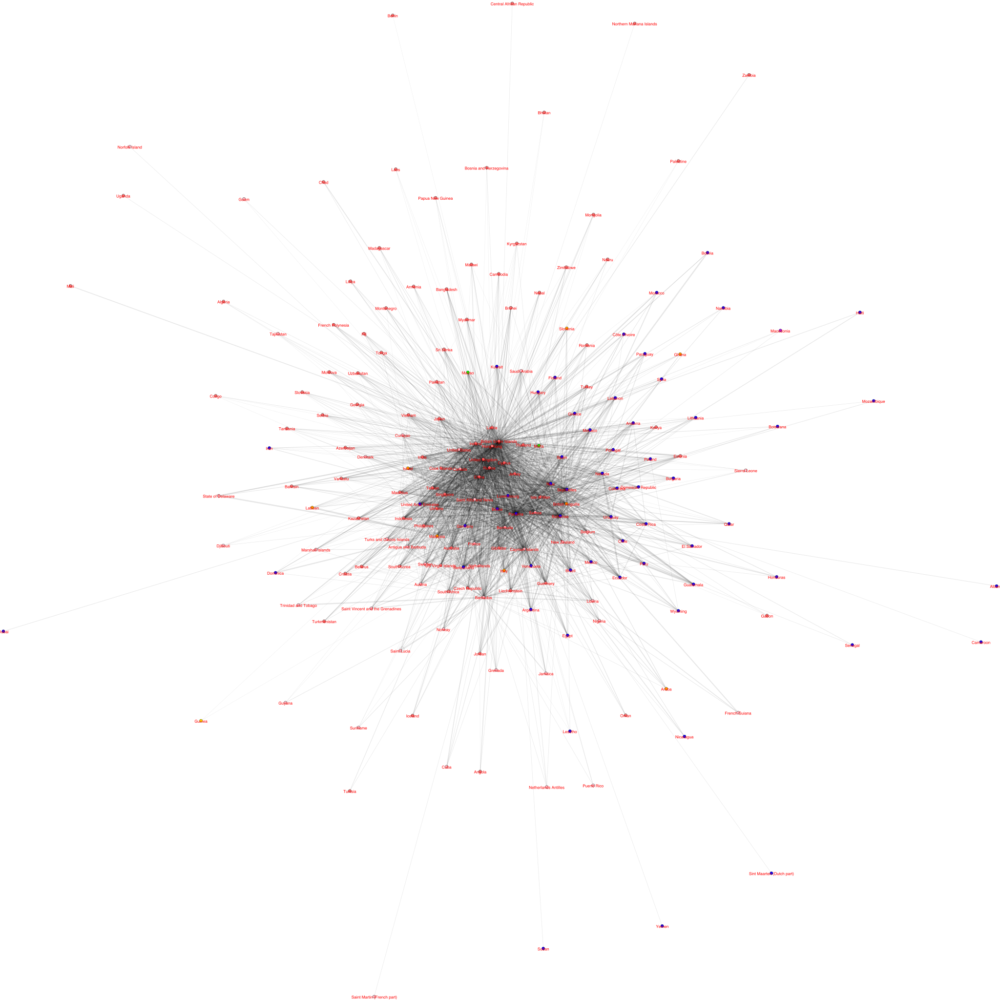

In [58]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_spinglass.membership)):
    vertex_colors.append(colors[comm_spinglass.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = np.log(g.es['weight']) + 1

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'images/communities_spinglass.png', vertex_label = g.vs['name'] , **visual_style)

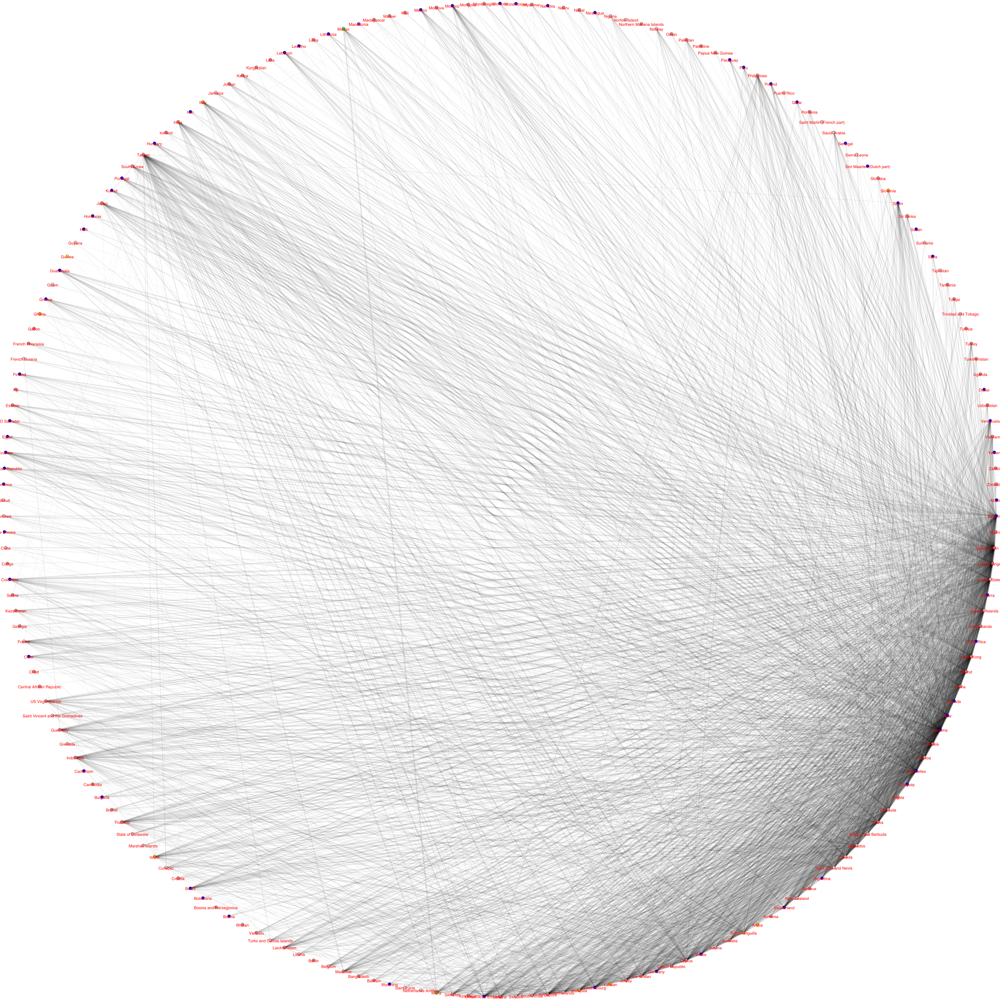

In [59]:
# Set the layout
my_layout = g.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'images/spinglass_circular.png', vertex_label = g.vs['name'] , **visual_style)

In [60]:
for i in range(len(comm_spinglass.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = np.log(comm_spinglass.subgraphs()[i].es['weight']) + 1
    # Set the layout
    my_layout = comm_spinglass.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_spinglass.subgraphs()[i],'images/spinglass_subgraph' + str(i) + '.png' ,vertex_label = comm_spinglass.subgraphs()[i].vs['name'],**visual_style  )
    

### Walktrap Community Detection

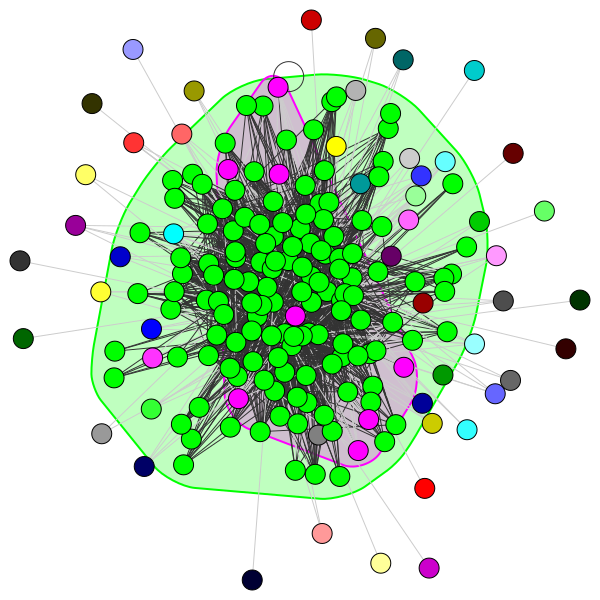

In [61]:
walktrap = g.community_walktrap(weights = 'weight', steps = 2)

comm_walktrap = walktrap.as_clustering()

ig.plot(comm_walktrap, mark_groups = True, layout="drl")

In [62]:
modularity = g.modularity(comm_walktrap, weights='weight')
print(modularity)

0.0020223572959788337


In [63]:
df_walktrap = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_walktrap.membership } )
df_walktrap

,name,community
0,Albania,0
1,Bahamas,1
2,Algeria,2
3,British Virgin Islands,1
4,United Kingdom,1
...,...,...
191,Venezuela,1
192,Vietnam,1
193,Yemen,51
194,Zambia,52


In [64]:
df_walktrap.describe()

,community
count,196.000000
mean,7.867347
std,13.652566
min,0.000000
25%,1.000000
50%,1.000000
75%,4.000000
max,52.000000


In [65]:
## no visualisation since too many communities, mostly individual

### Infomap Community Detection

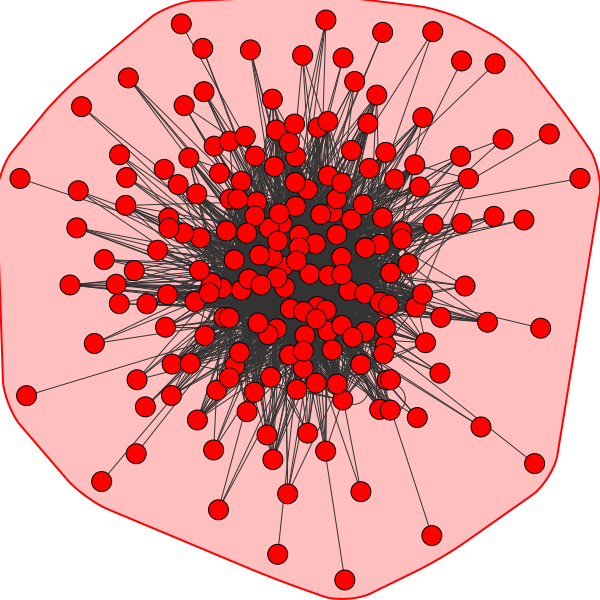

In [66]:
comm_infomap = g.community_infomap(edge_weights = 'weight')

ig.plot(comm_infomap, mark_groups = True, layout="drl")

In [67]:
modularity = g.modularity(comm_infomap, weights='weight')
print(modularity)

0.0


In [68]:
df_infomap = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_infomap.membership } )
df_infomap

,name,community
0,Albania,0
1,Bahamas,0
2,Algeria,0
3,British Virgin Islands,0
4,United Kingdom,0
...,...,...
191,Venezuela,0
192,Vietnam,0
193,Yemen,0
194,Zambia,0


In [69]:
## no visualisation since no community is detected

### Fast Greedy Community Detection

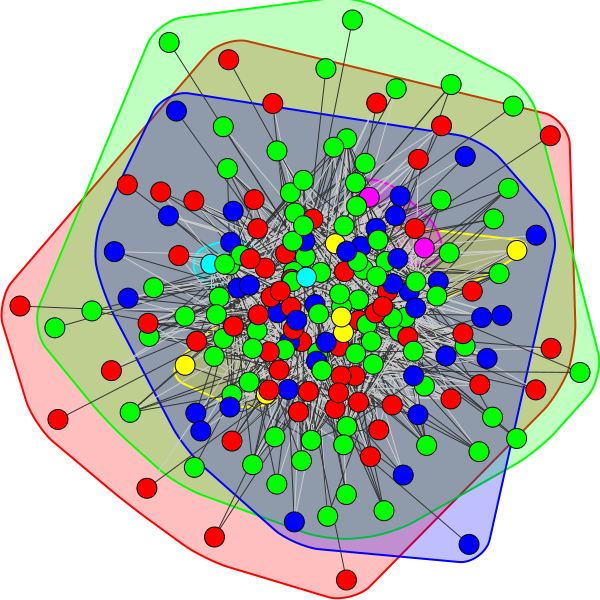

In [70]:
fg = g.community_fastgreedy(weights = 'weight')

comm_fastgreedy = fg.as_clustering()

ig.plot(comm_fastgreedy, mark_groups = True, layout="drl")

In [71]:
modularity = g.modularity(comm_fastgreedy, weights='weight')
print(modularity)

0.16231365315017704


In [72]:
df_fastgreedy = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_fastgreedy.membership } )
df_fastgreedy

,name,community
0,Albania,0
1,Bahamas,0
2,Algeria,1
3,British Virgin Islands,1
4,United Kingdom,1
...,...,...
191,Venezuela,0
192,Vietnam,1
193,Yemen,0
194,Zambia,1


In [73]:
df_fastgreedy.describe()

,community
count,196.000000
mean,1.030612
std,0.944122
min,0.000000
25%,0.000000
50%,1.000000
75%,2.000000
max,5.000000


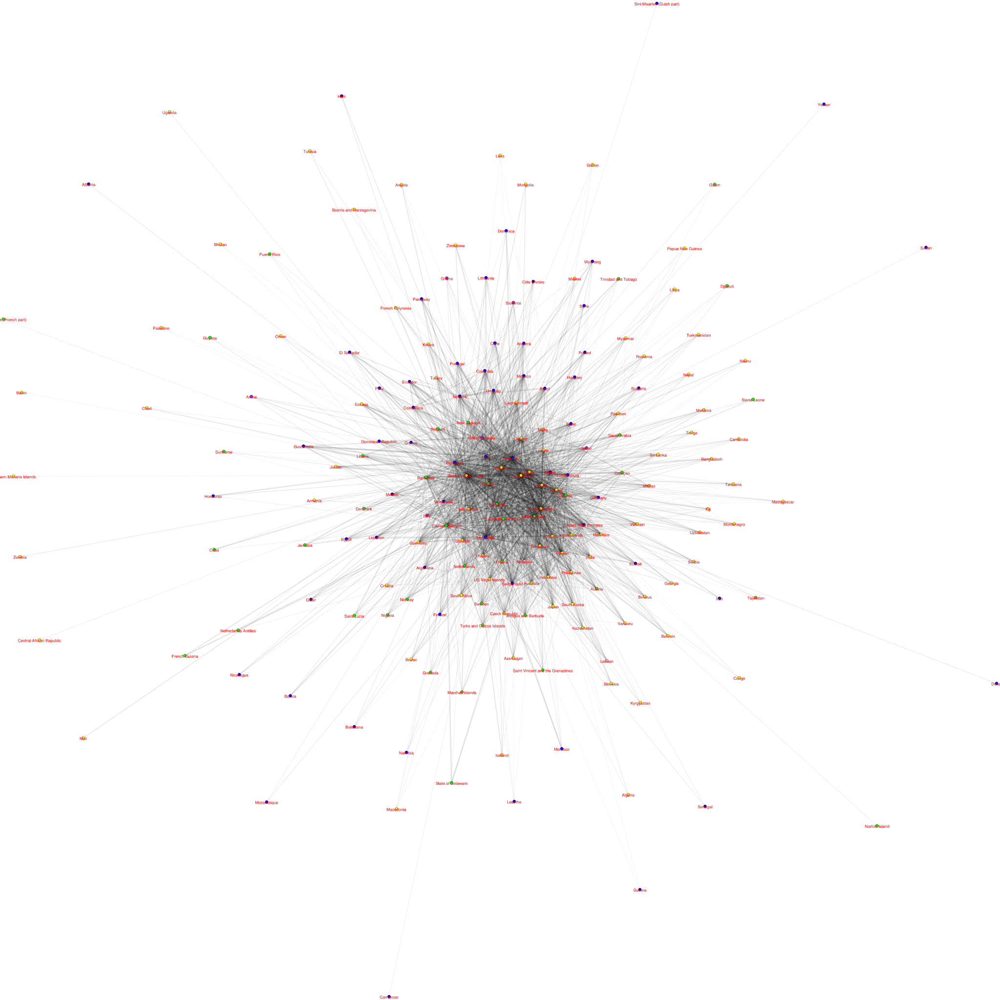

In [74]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_fastgreedy.membership)):
    vertex_colors.append(colors[comm_fastgreedy.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = np.log(g.es['weight']) + 1

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'images/communities_fastgreedy.png', vertex_label = g.vs['name'] , **visual_style)

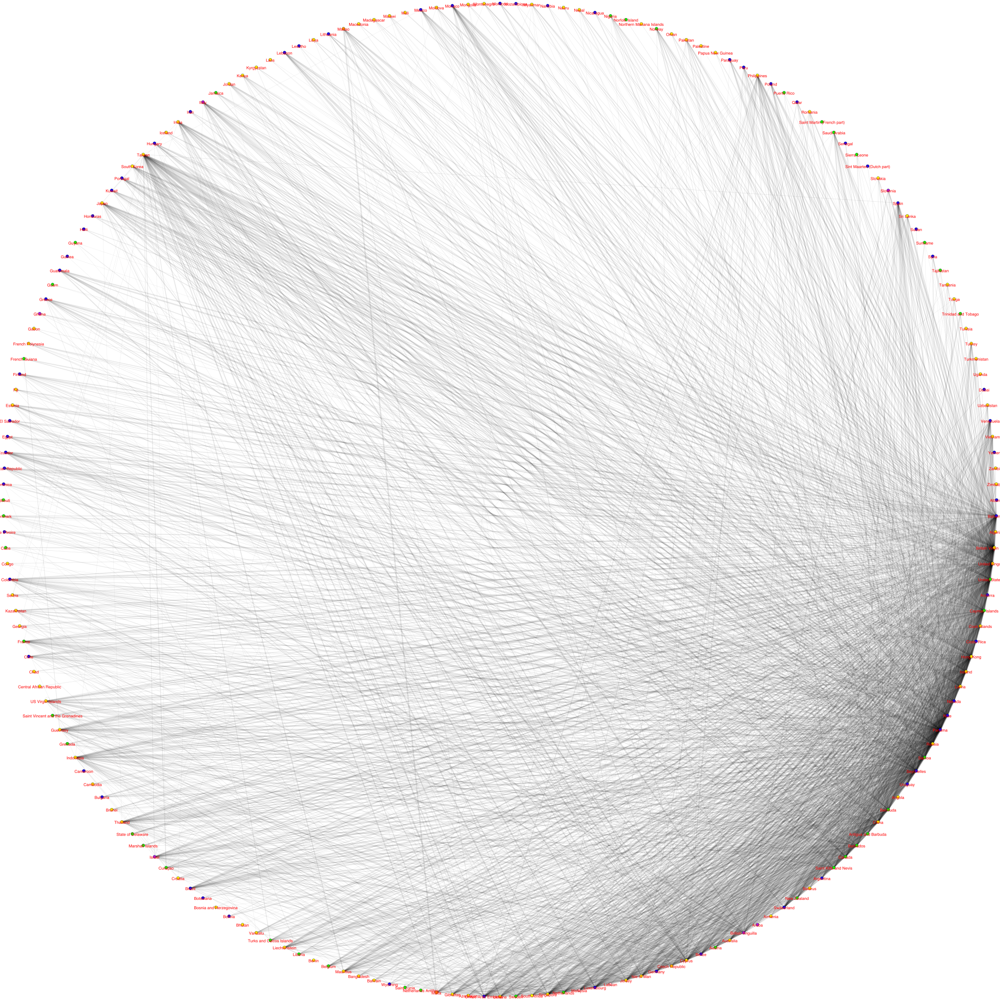

In [75]:
# Set the layout
my_layout = g.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'images/fastgreedy_circular.png', vertex_label = g.vs['name'] , **visual_style)

In [76]:
for i in range(len(comm_fastgreedy.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = np.log(comm_fastgreedy.subgraphs()[i].es['weight']) + 1
    # Set the layout
    my_layout = comm_fastgreedy.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_fastgreedy.subgraphs()[i],'images/fastgreedy_subgraph' + str(i) + '.png' ,vertex_label = comm_fastgreedy.subgraphs()[i].vs['name'],**visual_style  )
    

## Metrics

In [77]:
def get_avg_diameter(community):
    
    diameters = []
    
    for i in range(len(community.subgraphs())):
    
        diameters.append(community.subgraphs()[i].diameter())

    return np.mean(diameters)

In [78]:
def get_avg_transitivity(community):
    
    transitivity = []
    
    for i in range(len(community.subgraphs())):
    
        transitivity.append(community.subgraphs()[i].transitivity_undirected())

    return np.nanmean(transitivity)

In [79]:
get_avg_diameter(comm_fastgreedy)

2.1666666666666665

In [80]:
get_avg_transitivity(comm_fastgreedy)

0.25869265632050775

## Other Exploration

In [81]:
#g.cliques()

In [82]:
g.transitivity_undirected()

0.3859593515919117